# Stochastic Optimization - Reverse Search

This program finds the x vector, that minimizes in the L# in the set of points in the region {Ax<=b, x>=0, sum(x) <=1}

Initializing the A and b vectors

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# Initializing the A vector
array = [
    [0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0.9206, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.6406, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0.07943],
    [0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.6406, 0, 0, 0, 0.6406, 0.07943, 0, 0, 0, 0, 0.07943, 0, 0, 0.07943, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.07943, 0.07943, 0, 0]
]

# Initializing the B Vector
b = [0.4, 0.1, 0.2, 0.05, 0.05, 0, 0.2]


# 8 Vertices with lowest Sup Norm (from Dr. Bob's files)
array1 = [0.4345, 0.1086, 0.2173, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.2396, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
array2 = [0, 0.1086, 0.2173, 0, 0, 0, 0.4345, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.2396, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
array3 = [0.4345, 0, 0.2173, 0, 0, 0, 0, 0.1086, 0, 0, 0, 0, 0, 0, 0, 0, 0.2396, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
array4 = [0, 0, 0.2173, 0, 0, 0, 0.4345, 0.1086, 0, 0, 0, 0, 0, 0, 0, 0, 0.2396, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
array5 = [0.4345, 0.1086, 0, 0, 0, 0, 0, 0, 0.2173, 0, 0, 0, 0, 0, 0, 0, 0.2396, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
array6 = [0, 0.1086, 0, 0, 0, 0, 0.4345, 0, 0.2173, 0, 0, 0, 0, 0, 0, 0, 0.2396, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
array7 = [0.4345, 0, 0, 0, 0, 0, 0, 0.1086, 0.2173, 0, 0, 0, 0, 0, 0, 0, 0.2396, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
array8 = [0, 0, 0, 0, 0, 0, 0.4345, 0.1086, 0.2173, 0, 0, 0, 0, 0, 0, 0, 0.2396, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

# Initializing a few points that Chris Found using this program
array9 = np.array([0.1703264,  0.07590583, 0.05792959, 0.01936124, 0.02616234, 0., 0.23602246, 0.00456899, 0.13116965, 0.00680081, 0.,   0, 0.,  0. ,  0. ,  0. , 0.27175269 ,0.,  0. ,  0.  , 0.  , 0. ,  0. ,  0.,  0.  ,  0. ,  0. ,  0.  , 0. ,  0. ])
array10 = np.array([0.192, 0.058, 0.03,  0.008, 0.026, 0, 0.215, 0.022, 0.159, 0.018, 0, 0, 0, 0, 0, 0, 0.272, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
array11 = np.array([0,0, 0.045, 0.022, 0.026, 0, 0.406, 0.08, 0.144, 0.005, 0, 0, 0, 0, 0, 0, 0.272, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])


## MonteCarlo Approach to Finding Candidate x solutions

This approach chooses random points in the feasible region, and then returns the best performing point.

Zero Vector Error: 0.5049752469181039
Sim 150 Best Error: 0.386
Sim 349 Best Error: 0.3048
Sim 8577 Best Error: 0.2376
Sim 13497 Best Error: 0.2

Best Phi info
Given b      [0.4, 0.1, 0.2, 0.05, 0.05, 0, 0.2]
Calculated b [0.359 0.    0.184 0.    0.007 0.    0.164]
Difference   [0.041 0.1   0.016 0.05  0.043 0.    0.036]
L2 Norm:       0.13255370895322963
Infinity Norm 0.1



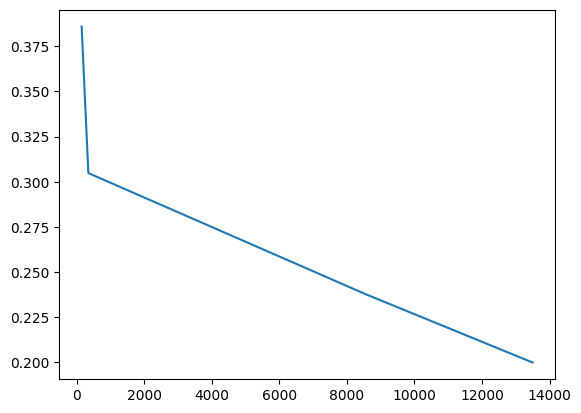

In [2]:
# Fxn - Randomly Initializing Phi

def initialize_vector():

    k= np.random.randint(5, 10)
    initial_phi = np.zeros(len(array[0]))
    random_indices = np.random.choice(len(initial_phi), k, replace=False)
    numbers = []
    numbers.append(np.random.uniform(0,0.5))
    random_max = 1 # or # np.random.uniform(0.9, 1)
    for _ in range(k-1):
           numbers.append(np.random.uniform(0, random_max - np.sum(numbers)))
    initial_phi[random_indices] = numbers
    return initial_phi

# Initialize Zero Vector and benchmark
zero_phi = np.zeros(len(array[0]))
zero_b = np.dot(array, zero_phi)
zero_error = np.linalg.norm(b - zero_b)

best_phi = zero_phi.copy()
best_error = zero_error.copy()
error_values = []
sim_values = []

print("Zero Vector Error:", zero_error)


# Trying to solve for best phi using montecarlo
for sim in range(250_000):
    
    # Randomly initialize phi
    initial_phi = initialize_vector()

    # Calculate The Dot Product
    computed_b = np.dot(array, initial_phi)

    # Calculate the Error Term
    diff = b - computed_b # Expected to be positive
    penalty1 = 10*np.sum(diff[diff < 0])  # Only sum negative differences and apply penalty
    penalty2 = 12.5 * np.min(diff) if np.min(diff) < 0 else 0
    penalty3 = 2*np.max(diff) # Super normal penalty for the largest positive difference
    error =  -penalty1 - penalty2 + penalty3

    # Store the best phi and error
    if error< best_error:
        best_error = error.copy()
        best_phi= initial_phi.copy()
        error_values.append(error)
        sim_values.append(sim)
        print("Sim", sim, "Best Error:", np.round(best_error,4))


# Post Processing and Visualizations

# Visualize Error Values improving
plt.plot(sim_values, error_values)

# Reevaluating the error
L2 = np.dot(array, best_phi)
error = np.linalg.norm(L2 - b)
print()
print("Best Phi info")

# Printing some vertices for comparison
vertices = [best_phi]

for vertex in vertices:
    comp_b = np.dot(array, vertex)
    error = np.linalg.norm(b - comp_b)
    print('Given b     ', b)
    print("Calculated b", np.round(comp_b,3))
    print('Difference  ', np.round(b - comp_b,3))
    print("L2 Norm:      ", error)
    print("Infinity Norm", np.max(np.abs(b - comp_b)))

    print()


# Stochastic Perturbations w/ Simulated Annealing

Zero Vector Error: 0.5049752469181039


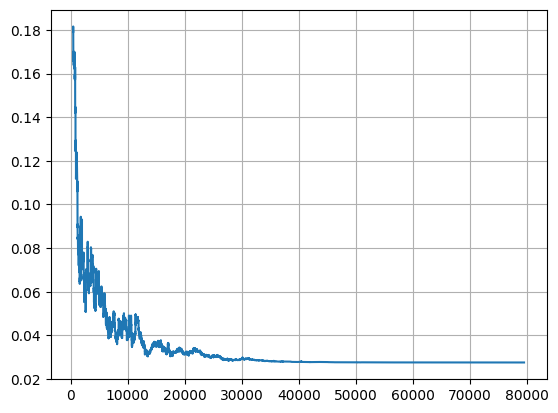

Best Error: 0.027602306546116877


In [3]:
import numpy as np
import matplotlib.pyplot as plt


# Function to calculate the custom error
def calculate_error(phi, penal_mult):
    computed_b = np.dot(array, phi)
    diff = b - computed_b                   # Expected to be positive
    penalty1 = -40*np.sum(diff[diff < 0])   # Ax>b penalty
    penalty2 = 0#.1*np.sum(diff[diff>0])       # L1 penalty
    penalty3 = 2*np.max(diff)               # Loo (inf) Penalty
    penalty4 = penal_mult*(1-sum(phi))**2   # L2 Norm Penalty
    penalties =  penalty1  + penalty3 + penalty4 +penalty2
    return penalties

# Initialize Zero Vector and bench mark
zero_phi = np.zeros(len(array[0]))
zero_b = np.dot(array, zero_phi)
zero_error = np.linalg.norm(b - zero_b)
print("Zero Vector Error:", zero_error)




# Parameters
T = 10e-3  # Initial temperature
T_min = 10e-8  # Minimum temperature
alpha = 0.93  # Cooling rate
num_iterations = 500  # Iterations per temperature
penal_mult = 1
step_size = 0.05



# Initializations
iter = 0
counter = []
error_values = []
best_values_all = []
error_values = []
sim_values = []

best_phi = zero_phi.copy()
best_values_all.append(best_phi)
best_error = np.inf
current_phi = initialize_vector()
current_error = np.inf

# Perturbations
while T > T_min:
    
    for i in range(num_iterations):
        
        iter += 1
        # Make a small change to phi
        new_phi = current_phi.copy()
        index = np.random.randint(0, len(new_phi))
        change = np.random.uniform(-step_size, step_size)  # Adjust magnitude of change as needed
        new_phi[index] += change
        new_phi[new_phi < 0] = 0  # Ensure non-negativity
        
        #Ensure new phi sums to 1
        if T < 0.00001:
            new_phi = new_phi/np.sum(new_phi)

        # Check if the sum constraint is violated
        if np.sum(new_phi) > 1:
            #print('Skipping with sum more than 1')
            continue  # Skip the rest of the loop and do not update current_phi or current_error

        # Calculate new error
        new_error = calculate_error(new_phi, penal_mult)
        #print('New error: ', new_error, 'current_error', current_error, 'best_error', best_error)

        # Acceptance condition
        if new_error < current_error or np.random.uniform() < np.exp((current_error - new_error) / T):
            current_phi = new_phi.copy()
            current_error = new_error.copy()
            counter.append(iter)
            error_values.append(current_error/2)
            if new_error < best_error:
                best_error = new_error.copy()
                best_phi = new_phi.copy()
                #print("Best Error:", best_error/2, "Temperature:", T)
                # Add best phi as a new row to the best_values_all list
                best_values_all.append(best_phi)

    # Cool down
    T *= alpha
    step_size *= alpha
    penal_mult *= 1.002


# Visualization
plt.plot(counter[250:], error_values[250:])
plt.grid()
plt.show()
print("Best Error:", best_error/2)


In [4]:
print('Best Phi:', np.round(best_phi,4), "with sum", sum(best_phi))

vertices = {
    "Interior Point": best_phi,
    "Bob1": array1,
    "Bob2": array2,
    "Bob3": array3,
    "Bob4": array4,
    "Bob5": array5,
    "Bob6": array6,
    "Bob7": array7,
    "Bob8": array8,
    "cw1": array9,
    "cw2": array10,
    "cw3": array11
}

print()
print('Desired b:', np.round(b,4))
print()

for name, vertex in vertices.items():
    comp_b = np.dot(array, vertex)
    error = np.linalg.norm(b - comp_b)
    print('Vertex:', name)
    print("Calculated b:", np.round(comp_b, 4))
    print('Difference:', np.round(b - comp_b, 4))
    print('Infinity Norm:', np.max(b - comp_b))
    print("L2 Norm:", error)
    print("L1 Norm:", np.sum(np.abs(b - comp_b)))

    print()



Best Phi: [0.2523 0.0356 0.0407 0.0154 0.0211 0.     0.1408 0.0353 0.1466 0.0044
 0.0165 0.0112 0.     0.0054 0.0004 0.     0.2691 0.0012 0.0042 0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ] with sum 0.9999999999999998

Desired b: [0.4  0.1  0.2  0.05 0.05 0.   0.2 ]

Vertex: Interior Point
Calculated b: [0.3724 0.0724 0.1724 0.0224 0.0224 0.     0.1724]
Difference: [0.0276 0.0276 0.0276 0.0276 0.0276 0.     0.0276]
Infinity Norm: 0.027602306546116877
L2 Norm: 0.06761125805748162
L1 Norm: 0.16561308310602832

Vertex: Bob1
Calculated b: [0.4    0.1    0.2    0.     0.     0.     0.1535]
Difference: [-0.      0.     -0.      0.05    0.05    0.      0.0465]
Infinity Norm: 0.05
L2 Norm: 0.08463681907466515
L1 Norm: 0.14658215999999996

Vertex: Bob2
Calculated b: [0.4    0.1    0.2    0.     0.     0.     0.1535]
Difference: [-0.      0.     -0.      0.05    0.05    0.      0.0465]
Infinity Norm: 0.05
L2 Norm: 0.08463681907466515
L1 Norm: 0.14658215999999996

Ve

# PCA of best points

In this section, I was trying to capture the complex journey in its 3PCA dimensions.

I am afraid that the vizualisation is a bit meaningless tho.

length of best values 533
30
533
4
[ 0.41290942  0.10309283 -0.05140919 -0.03347243]
[-0.05771032  0.00507408 -0.00417039  0.00028052]


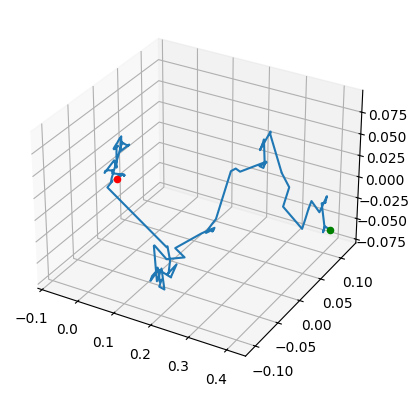

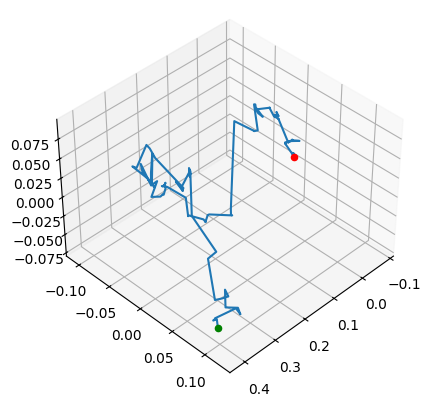

In [5]:
# Perform a PCA of 3 on the array best_values_all

from sklearn.decomposition import PCA
print('length of best values', len(best_values_all))
pca = PCA(n_components=4)
pca.fit(best_values_all)
print(pca.n_features_in_)
print(pca.n_samples_)
print(pca.n_components_)

# Transform the data
transformed = pca.transform(best_values_all)
transformed = transformed[2:]
print(transformed[0])
print(transformed[-1])

# Plot the transformed data as a line plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot(transformed[:, 0], transformed[:, 1], transformed[:, 2])
ax.scatter(transformed[0, 0], transformed[0, 1], transformed[0, 2], color='green')
ax.scatter(transformed[-1, 0], transformed[-1, 1], transformed[-1, 2], color='red')
plt.show()

# Show again from a different angle
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot(transformed[:, 0], transformed[:, 1], transformed[:, 2])
ax.scatter(transformed[0, 0], transformed[0, 1], transformed[0, 2], color='green')
ax.scatter(transformed[-1, 0], transformed[-1, 1], transformed[-1, 2], color='red')
ax.view_init(elev=40, azim=45)
plt.show()



## Checking if point discovered via Stochastic Optimization is a vertex

In [6]:
import numpy as np

# Fxn - Check if x is a vertex
def is_vertex(A, b, x):

    tol = 1e-2

    active_constraints = np.where(np.abs(np.dot(A, x) - b) < tol)[0]    
    active_nonneg_constraints = np.where(x < tol)[0]
    
    # Create the matrix A_total by combining active constraints
    A_eq = A[active_constraints, :]
    I_active = np.eye(len(x))[active_nonneg_constraints, :]
    A_total = np.vstack((A_eq, I_active))
    
    if A_total.shape[0] < len(x):
        return False
    
    rank_A_total = np.linalg.matrix_rank(A_total)
    
    return rank_A_total == len(x)


def perturb_points(x, perturbation, A, b):
    x1 = x.copy()
    x2 = x.copy()
    
    # Apply the perturbation to two indices
    x1[perturbation[0]] += perturbation[2]
    x1[perturbation[1]] -= perturbation[2]
    
    x2[perturbation[0]] -= perturbation[2]
    x2[perturbation[1]] += perturbation[2]
    
    # Check if both x1 and x2 are in the feasible region
    if (np.all(np.dot(A, x1) <= b) and np.all(x1 >= 0) and np.sum(x1) <= 1 and
        np.all(np.dot(A, x2) <= b) and np.all(x2 >= 0) and np.sum(x2) <= 1):
        return x1, x2
    return None, None



def find_points_averaging_to_x(A, b, x):

    perturbation_magnitude = 0.03    
    n = len(x)

    for i in range(n):
        for j in range(i + 1, n):

            perturbation = (i, j, perturbation_magnitude)            
            x1, x2 = perturb_points(x, perturbation, A, b)

            if x1 is not None and x2 is not None:
                return x1, x2
    
    raise ValueError("Could not find feasible perturbed points.")

# Assuming A, b, and x are defined as previously
A = np.array(array)
b = np.array(b)
x = best_phi.copy()

if is_vertex(A, b, x):
    print("The point is a vertex.")
else:
    x1, x2 = find_points_averaging_to_x(A, b, x)
    print("The point is not a vertex.")
    print("Here are two points that average to the given point:")
    print()
    print("Point 1:", np.round(x1,3))
    print()
    print("Original:", np.round(x,3))
    print()
    print("Point 2:", np.round(x2,3))


The point is not a vertex.
Here are two points that average to the given point:

Point 1: [0.282 0.036 0.041 0.015 0.021 0.    0.111 0.035 0.147 0.004 0.016 0.011
 0.    0.005 0.    0.    0.269 0.001 0.004 0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.   ]

Original: [0.252 0.036 0.041 0.015 0.021 0.    0.141 0.035 0.147 0.004 0.016 0.011
 0.    0.005 0.    0.    0.269 0.001 0.004 0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.   ]

Point 2: [0.222 0.036 0.041 0.015 0.021 0.    0.171 0.035 0.147 0.004 0.016 0.011
 0.    0.005 0.    0.    0.269 0.001 0.004 0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.   ]


## Linear Reformulation of Sup Norm Constraint

Solve for the x which  
Minimize the objective function  c = SupNorm |b-Ax| 

Ax<=b  
0<= x  
sum(x) <=1   




This can be rewritten as  

Solve for the x which  
Minimize the objective function  c= t 

Ax<=b  
0<= x  
sum(x) <=1   
b-Ax <=t  

Putting this in standard form:       

Ax<=b   
0<= x  
sum(x) <=1  
-Ax - t <= -b   
Ax - t <= b  

In this linear form, it can be solved using a LP solver


\begin{aligned}
\begin{bmatrix}
A & -A \\
-1 & -1
\end{bmatrix}
\begin{bmatrix}
x \\
t
\end{bmatrix}
&\leq
\begin{bmatrix}
b \\
-b
\end{bmatrix}
\end{aligned}




In [72]:
import numpy as np
from scipy.optimize import linprog

# Initializing the A vector
array = [
    [0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0.9206, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.6406, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0.07943],
    [0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.6406, 0, 0, 0, 0.6406, 0.07943, 0, 0, 0, 0, 0.07943, 0, 0, 0.07943, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.07943, 0.07943, 0, 0]
]

A = np.array(array)

# Initializing the B Vector
b = [0.4, 0.1, 0.2, 0.05, 0.05, 0, 0.2]
b = np.array(b)

# Solving for x


x_len = A.shape[1]

# Objective function: Minimize t
c = np.zeros(x_len + 1)  # n_vars for x and 1 for t
c[-1] = 1  # Coefficient of t in the objective function

# Creating Augmented A and Augmented b matrix
A_ub = np.hstack([A, -np.ones((A.shape[0], 1))])
A_ub = np.vstack([A_ub, np.hstack([-A, -np.ones((A.shape[0], 1))])])
b_ub = np.hstack([b, -b])

# Additional constraints: sum(x) <= 1
A_eq = np.zeros((1, x_len + 1))
A_eq[0, :x_len] = 1
b_eq = [1]

# Bounds for x and t
bounds = [(0, 1)] * x_len + [(0, None)]  # x in [0, 1] and t in [0, inf]

# Solving the linear programming problem
res = linprog(c, A_ub=A_ub, b_ub=b_ub, A_eq=A_eq, b_eq=b_eq, bounds=bounds, method='highs')

# Extracting the solution
x = res.x[:-1]
t = res.x[-1]

# Testing Results
b_found = A.dot(x)
bdifference = b - b_found
score = bdifference

print("Optimal value of objective function:", t)
print("Optimal solution x:", x)
print()
print('b desired', b)
print('b found', np.round(b_found,4))
print()
print('difference', np.round(score,4))
print("L2 norm is", np.linalg.norm(bdifference, 2))

solutionL1 = np.round(score,4)
solutionL2 = np.linalg.norm(bdifference, 2)


Optimal value of objective function: 0.025915132408575067
Optimal solution x: [0.         0.         0.         0.         0.02616214 0.
 0.40634898 0.08047455 0.18909936 0.02616214 0.         0.
 0.         0.         0.         0.         0.27175284 0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.        ]

b desired [0.4  0.1  0.2  0.05 0.05 0.   0.2 ]
b found [0.3741 0.0741 0.1741 0.0241 0.0241 0.     0.1741]

difference [0.0259 0.0259 0.0259 0.0259 0.0259 0.     0.0259]
L2 norm is 0.06347885101767253


## Linear Reformulation of L2 Norm

Solve for the  x  which  
minimizes the objective function  
c = ||b - Ax||  

Subject to:  
Ax <= b   
0 <= x   
sum(x) <= 1  

To put this in a form suitable for a quadratic programming solver, we need to convert the L2 norm objective function into a quadratic form.  
The L2 norm squared minimization can be expressed as:  

Minimize  
||b - Ax|| 2 = (b - Ax)^T  (b - Ax)  


Expanding this, we get:  
||b - Ax||2 = b^T b - 2 b^T A x + x^T A^T A  

Thus, the objective function to be minimized is:  
x^T A^T A x - b^T A x   


In Standard Form, the objective function to minimize:  
 x^T P x + q^T x

Where:  
P = 2 A^T A   
q = -2 A^T b   

Subject to:  
Ax <= b   
0 <= x   
sum(x) <= 1 

This can be solved using a QP solver.


In [79]:
import numpy as np
from scipy.optimize import linprog, minimize

# Initializing the A vector
array = [
    [0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0.9206, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.6406, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0.07943],
    [0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.6406, 0, 0, 0, 0.6406, 0.07943, 0, 0, 0, 0, 0.07943, 0, 0, 0.07943, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.07943, 0.07943, 0, 0]
]

A = np.array(array)

# Initializing the B Vector
b = [0.4, 0.1, 0.2, 0.05, 0.05, 0, 0.2]
b = np.array(b)

# Define the objective function (L2 norm)
def objective(x):
    return np.linalg.norm(np.dot(A, x) - b, 2)**2

# Define the equality constraint: sum(x) == 1
def constraint_eq(x):
    return np.sum(x) - 1

# Define the bounds for the variables: 0 <= x <= 1
bounds = [(0, 1) for _ in range(A.shape[1])]

# Initial guess for the variables
x0 = np.ones(A.shape[1]) / A.shape[1]

# Define the constraints dictionary
constraints = [{'type': 'eq', 'fun': constraint_eq}]

# Solve the minimization problem
result = minimize(objective, x0, bounds=bounds, constraints=constraints, method='SLSQP')

# Extract the solution
x = result.x

# Compute the resulting b vector
b_found = np.dot(A, x)
bdifference = b - b_found
score = np.linalg.norm(bdifference, 2)

print("Optimal solution x:", np.round(x,4))
print("b desired:", b)
print()
print("b found:", np.round(b_found, 4))
print("difference:", np.round(bdifference, 4))
print()
print("L2 norm of the difference:", score)
print("Sup norm is", np.max( np.round(bdifference, 4)))

Optimal solution x: [0.2043 0.0416 0.0958 0.0143 0.0287 0.     0.2043 0.0416 0.0958 0.0143
 0.     0.     0.     0.     0.     0.     0.2593 0.     0.     0.
 0.     0.     0.     0.     0.     0.     0.     0.     0.     0.    ]
b desired: [0.4  0.1  0.2  0.05 0.05 0.   0.2 ]

b found: [0.3762 0.0766 0.1763 0.0264 0.0264 0.     0.1661]
difference: [ 0.0238  0.0234  0.0237  0.0236  0.0236 -0.      0.0339]

L2 norm of the difference: 0.0627605594757765
Sup norm is 0.0339


## Combining them both



In [96]:
# Solve for the x which  
# Minimize the objective function  c = SupNorm |b-Ax| 

# Ax<=b  
# 0<= x  
# sum(x) <=1   




# This can be rewritten as  

# Solve for the x which  
# Minimize the objective function  c= t 

# Ax<=b  
# 0<= x  
# sum(x) <=1   
# b-Ax <=t  

# Putting this in standard form:       

# Ax<=b   
# 0<= x  
# sum(x) <=1  
# -Ax - t <= -b   
# Ax - t <= b  

# In this linear form, it can be solved using a LP solver


import numpy as np
from scipy.optimize import linprog, minimize

# Initializing the A vector
array = [
    [0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0.9206, 0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0.6406, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0.9206, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.6406, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0.07943, 0, 0, 0, 0, 0.07943],
    [0, 0, 0, 0, 0, 0.9206, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.6406, 0, 0, 0, 0.6406, 0.07943, 0, 0, 0, 0, 0.07943, 0, 0, 0.07943, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.6406, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0.07943, 0.07943, 0, 0]
]

A = np.array(array)

# Initializing the B Vector
b = np.array([0.4, 0.1, 0.2, 0.05, 0.05, 0, 0.2])

# Solving for x

# Function to minimize
def objective(vars):
    x = vars[:-1]
    t = vars[-1]
    residual = A.dot(x) - b
    sup_norm = t
    l2_norm = np.linalg.norm(residual, 2)
    return 1* sup_norm + 65 * l2_norm**2

# Constraints
cons = []
# Ax - b <= t
for i in range(A.shape[0]):
    cons.append({'type': 'ineq', 'fun': lambda vars, i=i: vars[-1] - (A[i, :].dot(vars[:-1]) - b[i])})
# -Ax + b <= t
for i in range(A.shape[0]):
    cons.append({'type': 'ineq', 'fun': lambda vars, i=i: vars[-1] + (A[i, :].dot(vars[:-1]) - b[i])})
# sum(x) <= 1
cons.append({'type': 'ineq', 'fun': lambda vars: 1 - np.sum(vars[:-1])})

# Bounds
bounds = [(0, None) for _ in range(A.shape[1])] + [(0, None)]

# Initial guess
x0 = np.zeros(A.shape[1] + 1)


# Optimization
result = minimize(objective, x0, method='trust-constr', bounds=bounds, constraints=cons)

# Extracting the solution
x = result.x[:-1]
t = result.x[-1]

# Results
b_found = A.dot(x)
bdifference = b - b_found
score = bdifference

print("Optimal value of objective function:", np.round(result.fun,3))
print("Optimal solution x:", np.round(x,3))
print()
print('b desired', b)
print('b found', np.round(b_found,4))
print()
print('difference', np.round(score,4))
print("L1 Norm is", np.max(bdifference))
print("L2 norm is", np.linalg.norm(bdifference, 2))
print()

print("Sup norm is ", np.max( np.round(bdifference,4)), "L2 " ,  np.linalg.norm(bdifference, 2))

print("For comparion Linf", np.max(solutionL1), " L2 ", solutionL2)


Optimal value of objective function: 0.287
Optimal solution x: [0.203 0.04  0.095 0.013 0.027 0.    0.204 0.041 0.095 0.013 0.    0.
 0.    0.    0.    0.    0.268 0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.    0.    0.    0.   ]

b desired [0.4  0.1  0.2  0.05 0.05 0.   0.2 ]
b found [0.3748 0.0748 0.1748 0.0248 0.0248 0.     0.1715]

difference [ 0.0252  0.0252  0.0252  0.0252  0.0252 -0.      0.0285]
L1 Norm is 0.028504512653261593
L2 norm is 0.06309328005703593

Sup norm is  0.0285 L2  0.06309328005703593
For comparion Linf 0.0259  L2  0.06347885101767253


In [4]:
# Karush-Kuhn-Tucker System

# Consider the following quadratic programming problem. Denoting the Lagrangian multiplier vectors of the constraints
# AX>=b and x>=0 by u and v, respectively, 
# y is our slack variables
# The KKT conditions can be written as
# Ax +y = b
# - H*x - A.T*u +v = c
# x.t*v=0, u.t*y=0
# x,y,u,v >=0

# Now let M = [0 , -A; A.T H]
# q = [b; c]
# w = [y; v]
# z = [u; x]

# We can rewrite the KKT conditions as the linear complementary problem
# w - Mz = q, w.T*z = 0, (w,z) >=0

# Thus, the complementary problem can be solved using Lemke's pivoting algorithm.

# Let's try it

# Minimize - 2x1 - 6x2 + 2*x1**2 -2x1*x2 +2*x2**2
# Subject to x1+x2 <=2
# -x1 + 2x2 <=2
# x1, x2 >=0


import numpy as np


# Define the matrices and vectors
A = np.vstack([np.array([1,1]), np.array([-1,2])])
H = np.vstack([np.array([2,-2]), np.array([-2,4])])
b = np.array([2, 2])
c = np.array([-2, -6])

# Define the KKT matrix M and vector q
M = np.vstack([np.hstack([np.zeros((A.shape[0], A.shape[0])), -A]), np.hstack([A.T, H])])
q = np.concatenate([b, c])

print(M)
print(q)



[[ 0.  0. -1. -1.]
 [ 0.  0.  1. -2.]
 [ 1. -1.  2. -2.]
 [ 1.  2. -2.  4.]]
[ 2  2 -2 -6]


In [26]:
import numpy as np

def lemke_algorithm(M, q):
    num_vars = len(q)
    num_constraints = M.shape[0]
    
    # Create a column of ones
    ones_col = np.ones((num_constraints, 1))

    # Initialize tableau
    # Adjust tableau to include the identity matrix, -M, and (ones - q)
    tableau = np.hstack([np.eye(num_constraints), -M, ones_col, - q[:, None]])
    print(tableau)

    def pivot(entry_row, entry_col):
        print(f"Pivoting on row {entry_row}, column {entry_col}")
        pivot_value = tableau[entry_row, entry_col]
        tableau[entry_row, :] /= pivot_value
        for r in range(tableau.shape[0]):
            if r != entry_row:
                factor = tableau[r, entry_col]
                tableau[r, :] -= factor * tableau[entry_row, :]
        print("Tableau after pivot:")
        print(tableau)
    
    def find_pivot_entry():
        for col in range(tableau.shape[1] - 1):  # Exclude last column (b values)
            if np.any(tableau[:, col] < 0):
                row = np.argmin(tableau[:, col])
                if tableau[row, col] < 0:
                    return row, col
        return None, None
    
    # Start pivoting
    iteration = 0
    while True:
        print(f"Iteration {iteration}")
        print("Current tableau:")
        print(tableau)
        
        entry_row, entry_col = find_pivot_entry()
        if entry_row is None:
            break
        pivot(entry_row, entry_col)
        iteration += 1
    
    # Extract the solution
    x = np.zeros(num_vars)
    x[:num_constraints] = tableau[:num_constraints, -1]  # Extract solution from tableau
    
    return x

# Define the matrices and vectors
A = np.vstack([np.array([1, 1]), np.array([-1, 2])])
H = np.vstack([np.array([2, -2]), np.array([-2, 4])])
b = np.array([2, 2])
c = np.array([-2, -6])

# Define the KKT matrix M and vector q
M = np.vstack([np.hstack([np.zeros((A.shape[0], A.shape[0])), -A]), np.hstack([A.T, H])])
q = np.concatenate([b, c])

print("Matrix M:")
print(M)
print("Vector q:")
print(q)

# Solve the LCP using Lemke's algorithm
solution = lemke_algorithm(M, q)
print("Solution:")
print(solution)


Matrix M:
[[ 0.  0. -1. -1.]
 [ 0.  0.  1. -2.]
 [ 1. -1.  2. -2.]
 [ 1.  2. -2.  4.]]
Vector q:
[ 2  2 -2 -6]
[[ 1.  0.  0.  0. -0. -0.  1.  1.  1. -2.]
 [ 0.  1.  0.  0. -0. -0. -1.  2.  1. -2.]
 [ 0.  0.  1.  0. -1.  1. -2.  2.  1.  2.]
 [ 0.  0.  0.  1. -1. -2.  2. -4.  1.  6.]]
Iteration 0
Current tableau:
[[ 1.  0.  0.  0. -0. -0.  1.  1.  1. -2.]
 [ 0.  1.  0.  0. -0. -0. -1.  2.  1. -2.]
 [ 0.  0.  1.  0. -1.  1. -2.  2.  1.  2.]
 [ 0.  0.  0.  1. -1. -2.  2. -4.  1.  6.]]
Pivoting on row 2, column 4
Tableau after pivot:
[[ 1.  0.  0.  0.  0. -0.  1.  1.  1. -2.]
 [ 0.  1.  0.  0.  0. -0. -1.  2.  1. -2.]
 [-0. -0. -1. -0.  1. -1.  2. -2. -1. -2.]
 [ 0.  0. -1.  1.  0. -3.  4. -6.  0.  4.]]
Iteration 1
Current tableau:
[[ 1.  0.  0.  0.  0. -0.  1.  1.  1. -2.]
 [ 0.  1.  0.  0.  0. -0. -1.  2.  1. -2.]
 [-0. -0. -1. -0.  1. -1.  2. -2. -1. -2.]
 [ 0.  0. -1.  1.  0. -3.  4. -6.  0.  4.]]
Pivoting on row 2, column 2
Tableau after pivot:
[[ 1.  0.  0.  0.  0. -0.  1.  1.  1. -2.

KeyboardInterrupt: 